In [1]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

In [2]:
# Load original image
img = cv2.imread('/content/test5.jpg')

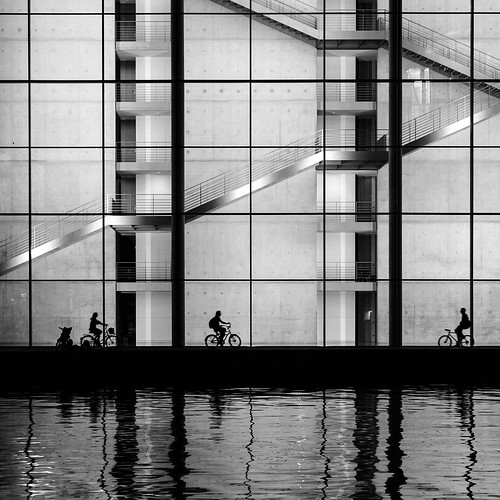

In [3]:
cv2_imshow(img)

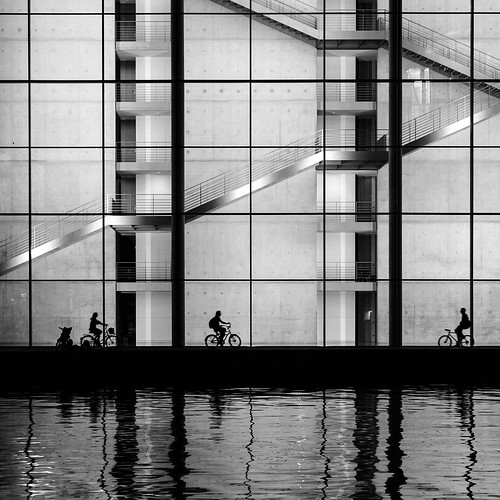

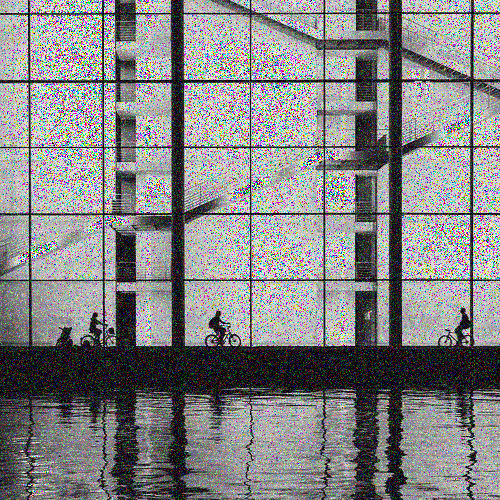

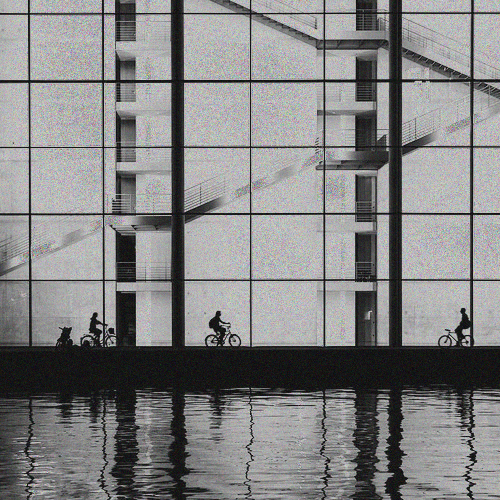

-1

In [4]:
# Create list to store noisy images
images = []
# Generate noisy images using cv2.randn. Can use your own mean and std.
for _ in range(20):
    img1 = img.copy() 
    cv2.randn(img1,(0,0,0),(50,50,50))  #cv2.randn(image, mean, standard deviation) 
    images.append(img+img1)
# For averaging create an empty array, then add images to this array.
img_avg=np.zeros((img.shape[0],img.shape[1],img.shape[2]),np.float32)
for im in images:
    img_avg=img_avg+im/20
# Round the float values. Always specify the dtype
img_avg=np.array(np.round(img_avg),dtype=np.uint8)
# Display the images
cv2_imshow(img)
cv2_imshow(images[1])
cv2_imshow(img_avg)

cv2.waitKey(0)

# Image Negatives

In [5]:
img = cv2.imread('/content/test5.jpg')

uint8


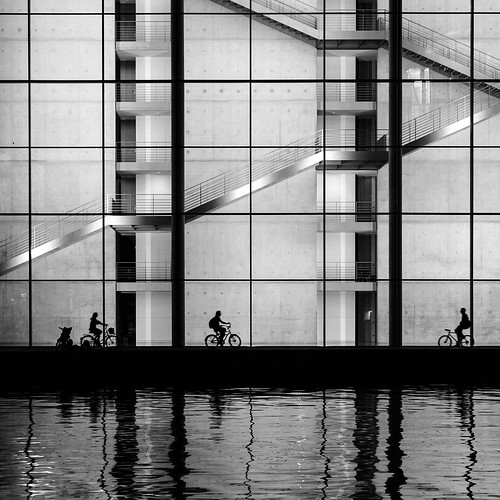

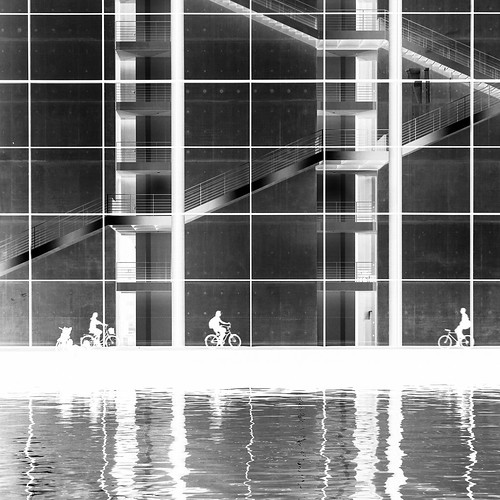

-1

In [6]:
# Check the datatype of the image
print(img.dtype)
# Subtract the img from max value(calculated from dtype)
img_neg = 255 - img
# Show the image
cv2_imshow(img)
cv2_imshow(img_neg)
cv2.waitKey(0)

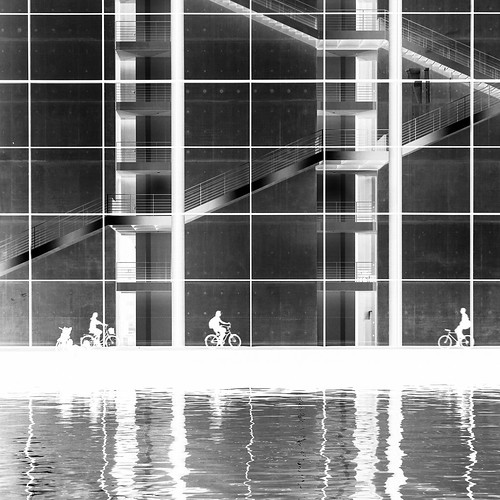

-1

In [7]:
# Method 2 OpenCV provides a built-in function cv2.bitwise_not()  
#that inverts every bit of an array. This takes as input the original image and outputs the inverted image. Below is the code for this.

# Invert the image using cv2.bitwise_not
img_neg = cv2.bitwise_not(img)

# Show the image
cv2_imshow(img_neg)
cv2.waitKey(0)

# Log Transformation

In [8]:
img = cv2.imread('/content/test5.jpg')

<ipython-input-9-959ab37b3811>:2: RuntimeWarning: divide by zero encountered in log
  img_log = (np.log(img+1)/(np.log(1+np.max(img))))*255


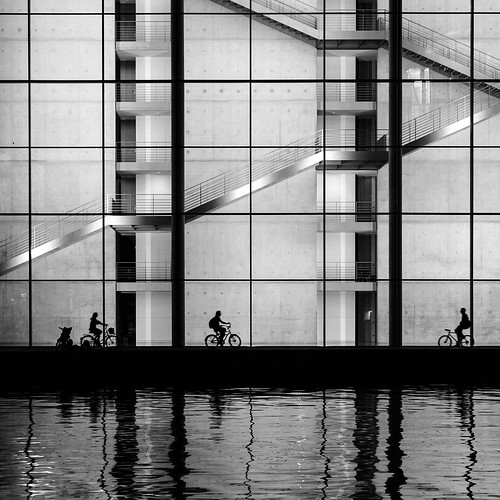

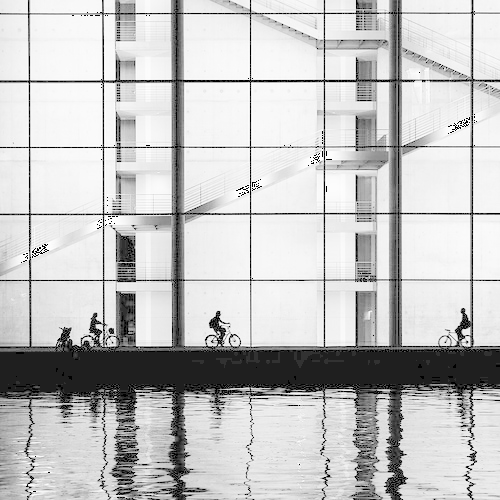

-1

In [9]:
# Apply log transform
img_log = (np.log(img+1)/(np.log(1+np.max(img))))*255
# Specify the data type
img_log = np.array(img_log,dtype=np.uint8)
# Display the image
cv2_imshow(img)
cv2_imshow(img_log )
cv2.waitKey(0)

# Power Law (Gamma) Transformations


In [10]:
img = cv2.imread('/content/test5.jpg')

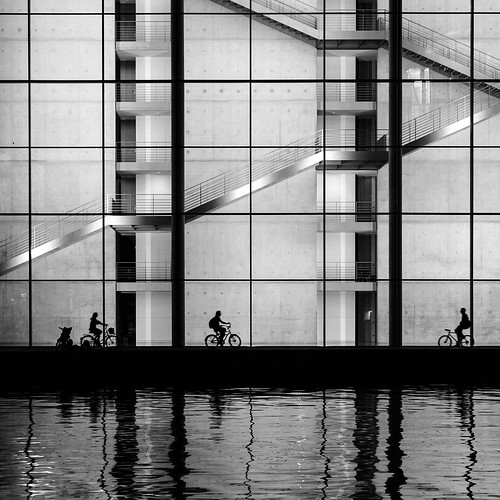

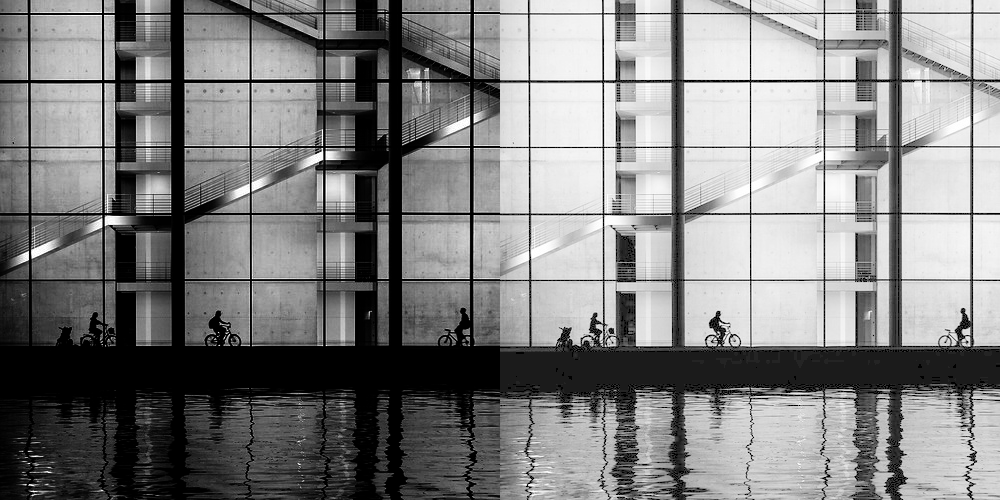

-1

In [11]:
# Apply Gamma=2.2 on the normalised image and then multiply by scaling constant (For 8 bit, c=255)
gamma_two_point_two = np.array(255*(img/255)**2.2,dtype='uint8')
# Similarly, Apply Gamma=0.4 
gamma_point_four = np.array(255*(img/255)**0.4,dtype='uint8')
# Display the images in subplots
cv2_imshow(img)
img3 = cv2.hconcat([gamma_two_point_two,gamma_point_four])
cv2_imshow(img3)
cv2.waitKey(0)


# Contrast in Image Processing

In [12]:
img1 = cv2.imread('/content/test5.jpg',0)

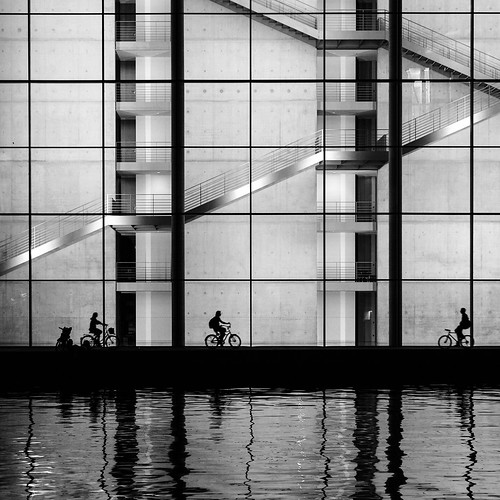

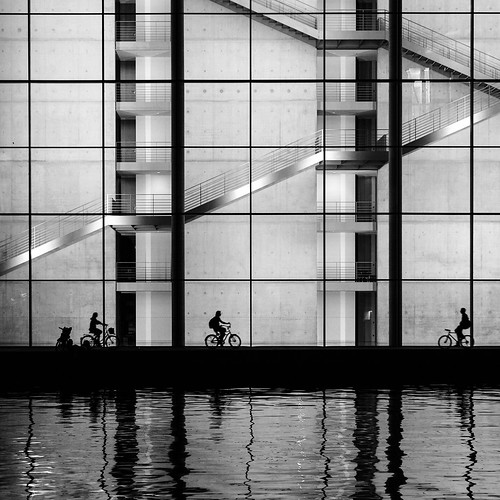

-1

In [13]:
# Create zeros array to store the stretched image
minmax_img = np.zeros((img1.shape[0],img1.shape[1]),dtype = 'uint8')

# Loop over the image and apply Min-Max formulae
for i in range(img1.shape[0]):
    for j in range(img1.shape[1]):
        minmax_img[i,j] = 255*(img1[i,j]-np.min(img1))/(np.max(img1)-np.min(img1))

# Displat the stretched image
cv2_imshow(img1)
cv2_imshow(minmax_img)
cv2.waitKey(0)

# Intensity Level Slicing

In [14]:
img = cv2.imread('/content/test5.jpg',0)

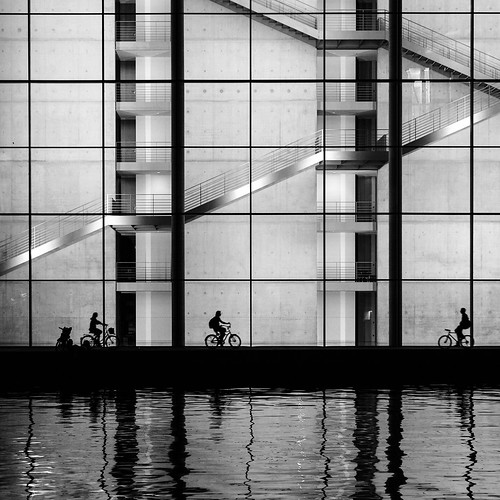

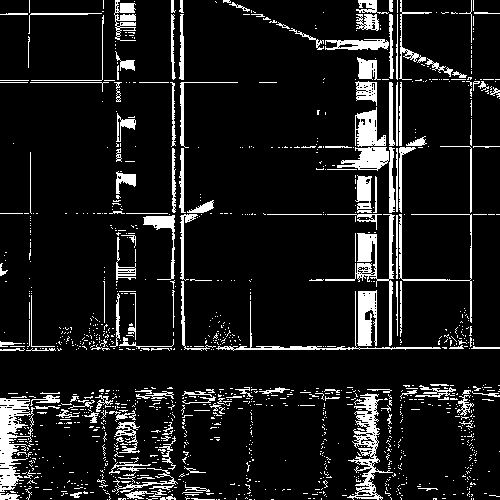

-1

In [15]:
# Find width and height of image
row, column = img.shape
# Create an zeros array to store the sliced image
img1 = np.zeros((row,column),dtype = 'uint8')

# Specify the min and max range
min_range = 10
max_range = 60

# Loop over the input image and if pixel value lies in desired range set it to 255 otherwise set it to 0.
for i in range(row):
    for j in range(column):
        if img[i,j]>min_range and img[i,j]<max_range:
            img1[i,j] = 255
        else:
            img1[i,j] = 0
# Display the image
cv2_imshow(img)
cv2_imshow(img1)
cv2.waitKey(0)

# Bit-plane Slicing

In [16]:
img = cv2.imread('/content/test5.jpg',0)

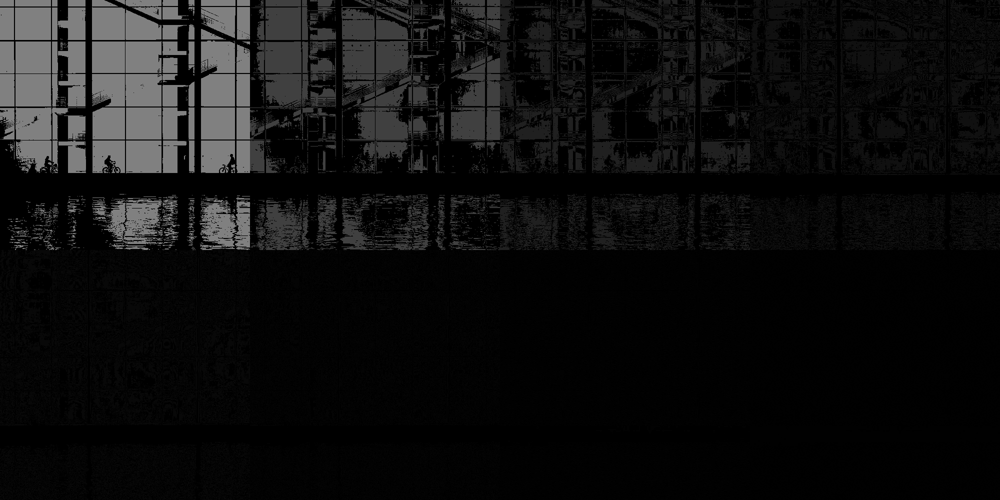

-1

In [17]:
#Iterate over each pixel and change pixel value to binary using np.binary_repr() and store it in a list.
lst = []
for i in range(img.shape[0]):
    for j in range(img.shape[1]):
         lst.append(np.binary_repr(img[i][j] ,width=8)) # width = no. of bits

# We have a list of strings where each string represents binary pixel value. To extract bit planes we need to iterate over the strings and store the characters corresponding to bit planes into lists.
# Multiply with 2^(n-1) and reshape to reconstruct the bit image.
eight_bit_img = (np.array([int(i[0]) for i in lst],dtype = np.uint8) * 128).reshape(img.shape[0],img.shape[1])
seven_bit_img = (np.array([int(i[1]) for i in lst],dtype = np.uint8) * 64).reshape(img.shape[0],img.shape[1])
six_bit_img = (np.array([int(i[2]) for i in lst],dtype = np.uint8) * 32).reshape(img.shape[0],img.shape[1])
five_bit_img = (np.array([int(i[3]) for i in lst],dtype = np.uint8) * 16).reshape(img.shape[0],img.shape[1])
four_bit_img = (np.array([int(i[4]) for i in lst],dtype = np.uint8) * 8).reshape(img.shape[0],img.shape[1])
three_bit_img = (np.array([int(i[5]) for i in lst],dtype = np.uint8) * 4).reshape(img.shape[0],img.shape[1])
two_bit_img = (np.array([int(i[6]) for i in lst],dtype = np.uint8) * 2).reshape(img.shape[0],img.shape[1])
one_bit_img = (np.array([int(i[7]) for i in lst],dtype = np.uint8) * 1).reshape(img.shape[0],img.shape[1])

#Concatenate these images for ease of display using cv2.hconcat()
finalr = cv2.hconcat([eight_bit_img,seven_bit_img,six_bit_img,five_bit_img])
finalv =cv2.hconcat([four_bit_img,three_bit_img,two_bit_img,one_bit_img])

# Vertically concatenate
final = cv2.vconcat([finalr,finalv])

# Display the images
cv2_imshow(final)
cv2.waitKey(0) 

# Histogram

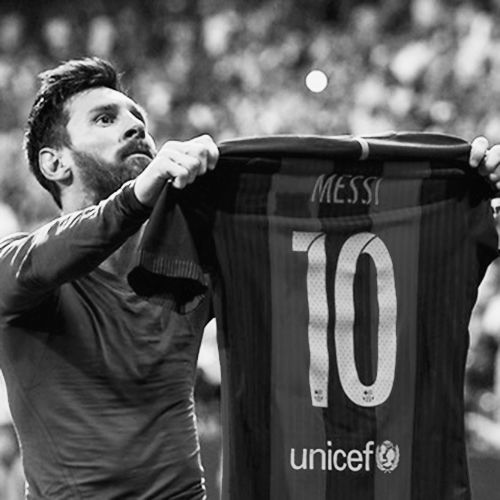

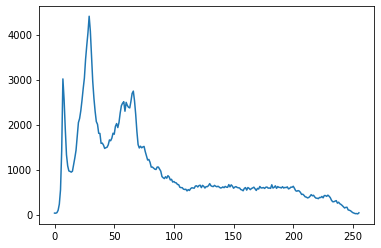

In [18]:
# Load the image
image = cv2.imread('/content/messi500.jpg',0)

# Calculate histogram using cv2.calcHist()
hist = cv2.calcHist([image], [0], None, [256], [0,256])

cv2_imshow(image)
# Display the histogram
plt.plot(hist)

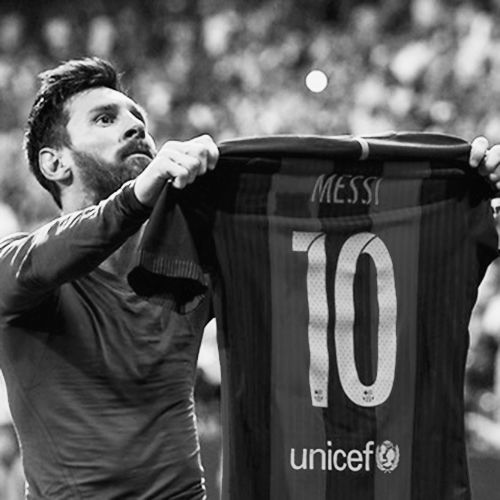

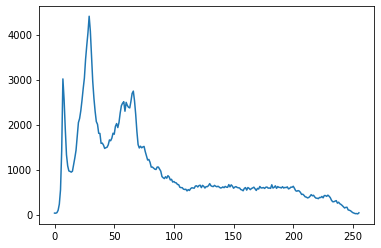

In [19]:
# Load the image
image = cv2.imread('/content/messi500.jpg',0)

# Calculate histogram using cv2.calcHist()
hist = cv2.calcHist([image], [0], None, [256], [0,256])

cv2_imshow(image)
# Display the histogram
plt.plot(hist)

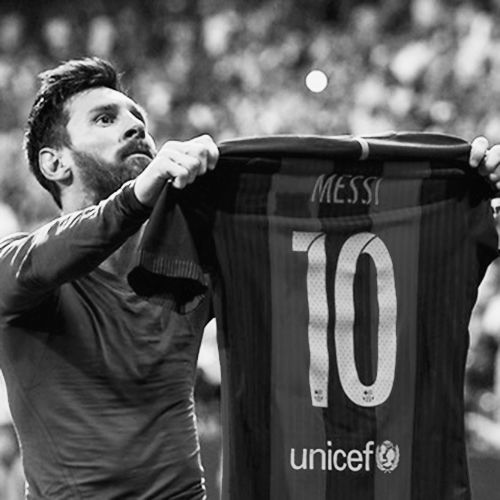

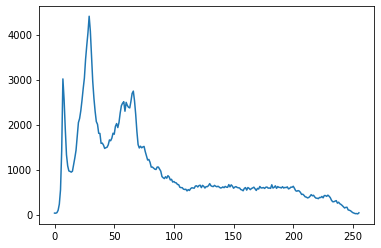

In [20]:
# Load the image
image = cv2.imread('/content/messi500.jpg',0)

# Calculate histogram using cv2.calcHist()
hist = cv2.calcHist([image], [0], None, [256], [0,256])

cv2_imshow(image)
# Display the histogram
plt.plot(hist)

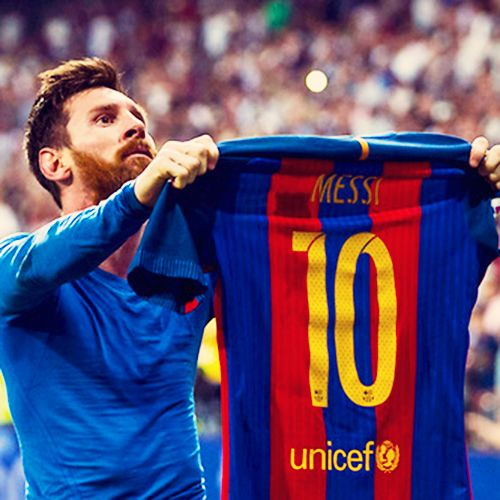

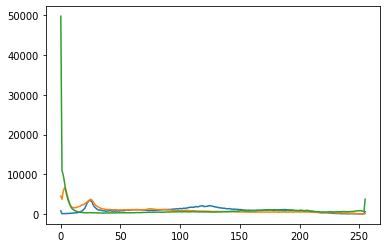

In [21]:
# Load the image
image = cv2.imread('/content/messi500.jpg')

# Calculate histogram using cv2.calcHist()
hist1 = cv2.calcHist([image], [0], None, [256], [0,256])
hist2 = cv2.calcHist([image], [1], None, [256], [0,256])
hist3 = cv2.calcHist([image], [2], None, [256], [0,256])

cv2_imshow(image)
# Display the histogram
plt.plot(hist1)
plt.plot(hist2)
plt.plot(hist3)

# Histogram stretch

In [22]:
img = cv2.imread('/content/messi500.jpg',0)


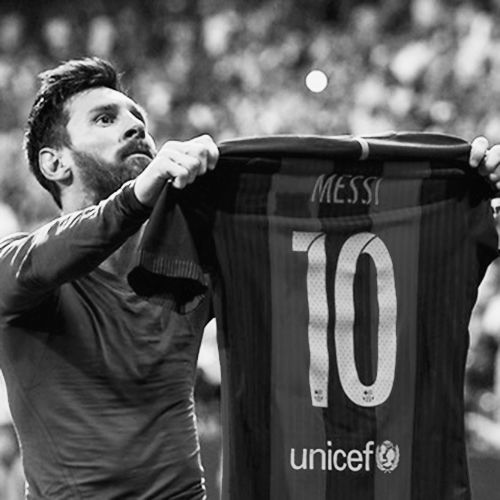

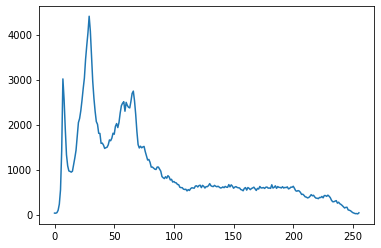

In [23]:
# Calculate histogram using cv2.calcHist()
hist = cv2.calcHist([img], [0], None, [256], [0,256])

cv2_imshow(img)
# Display the histogram
plt.plot(hist)

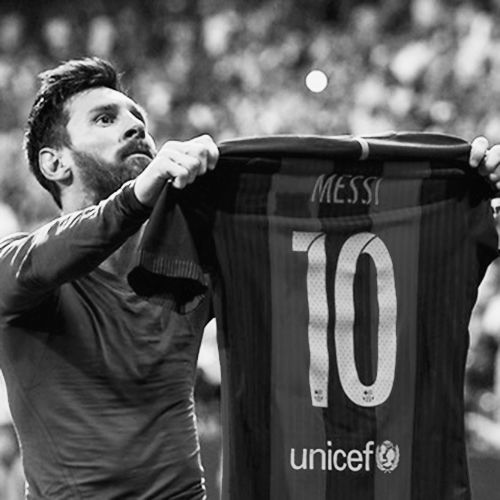

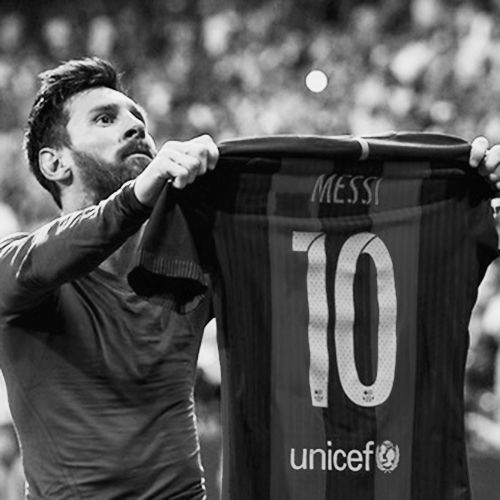

In [24]:
# Create zeros array to store the stretched image
minmax_img = np.zeros((img.shape[0],img.shape[1]),dtype = 'uint8')

# Loop over the image and apply Min-Max formulae
for i in range(img.shape[0]):
    for j in range(img.shape[1]):
        minmax_img[i,j] = 250*(img[i,j]-np.min(img))/(np.max(img)-np.min(img))

# Displat the stretched image
cv2_imshow(img)
cv2_imshow(minmax_img)


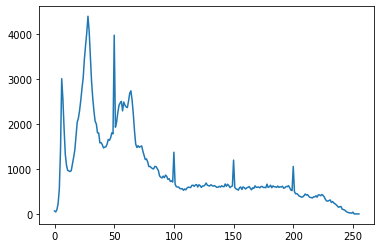

In [25]:
# Calculate histogram using cv2.calcHist()
hist = cv2.calcHist([minmax_img], [0], None, [256], [0,256])

# Display the histogram
plt.plot(hist)

#  Histogram Equalization

In [26]:
img1 = cv2.imread('/content/messi500.jpg',0)


In [27]:
img_Equa=cv2.equalizeHist(img1) 

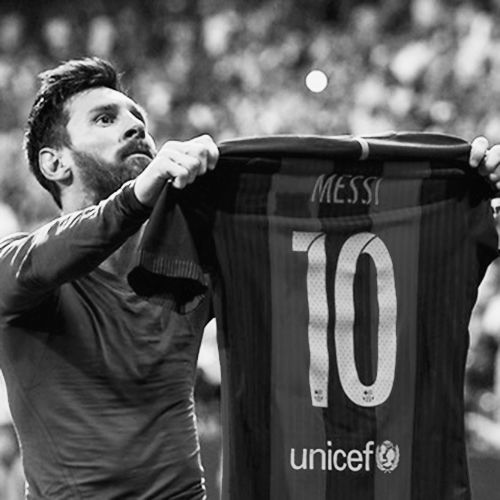

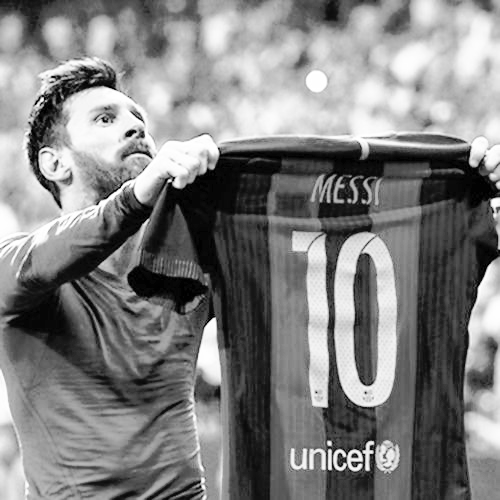

In [28]:
# Displat the stretched image
cv2_imshow(img1)
cv2_imshow(img_Equa)

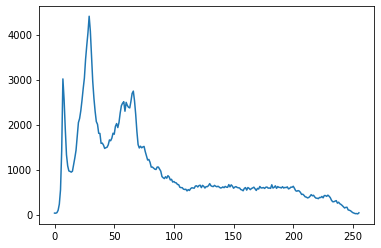

In [29]:
# Calculate histogram using cv2.calcHist()
hist = cv2.calcHist([img1], [0], None, [256], [0,256])

# Display the histogram
plt.plot(hist)

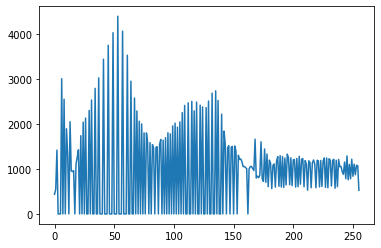

In [30]:
# Calculate histogram using cv2.calcHist()
hist = cv2.calcHist([img_Equa], [0], None, [256], [0,256])

# Display the histogram
plt.plot(hist)

# Spatial Filtering

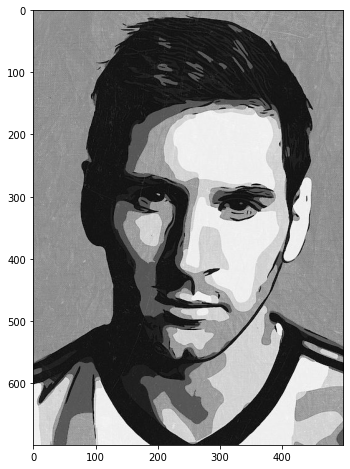

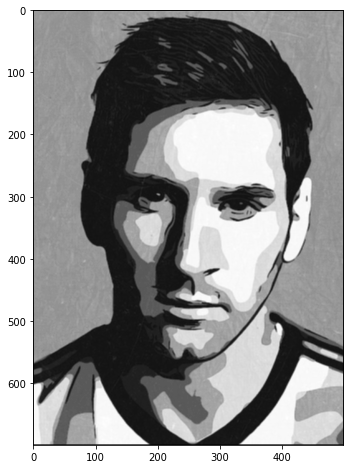

In [31]:
# Read the image
img = cv2.imread('/content/messi50.jpg', 0)
 
# Obtain number of rows and columns
# of the image
m, n = img.shape
  
# Develop Averaging filter(3, 3) mask
mask = np.ones([3, 3], dtype = int)
mask = mask / 9
  
# Convolve the 3X3 mask over the image
img_new = np.zeros([m, n])
 
for i in range(1, m-1):
    for j in range(1, n-1):
        temp = img[i-1, j-1]*mask[0, 0]+img[i-1, j]*mask[0, 1]+img[i-1, j + 1]*mask[0, 2]+img[i, j-1]*mask[1, 0]+ img[i, j]*mask[1, 1]+img[i, j + 1]*mask[1, 2]+img[i + 1, j-1]*mask[2, 0]+img[i + 1, j]*mask[2, 1]+img[i + 1, j + 1]*mask[2, 2]
        
        img_new[i, j]= temp
         
img_new = img_new.astype(np.uint8)
cv2.imwrite('blurred.tif', img_new)

plt.figure(figsize=(8,8))
plt.imshow(img,cmap='gray')
plt.show()
plt.figure(figsize=(8,8))
plt.imshow(img_new,cmap='gray')
plt.show()

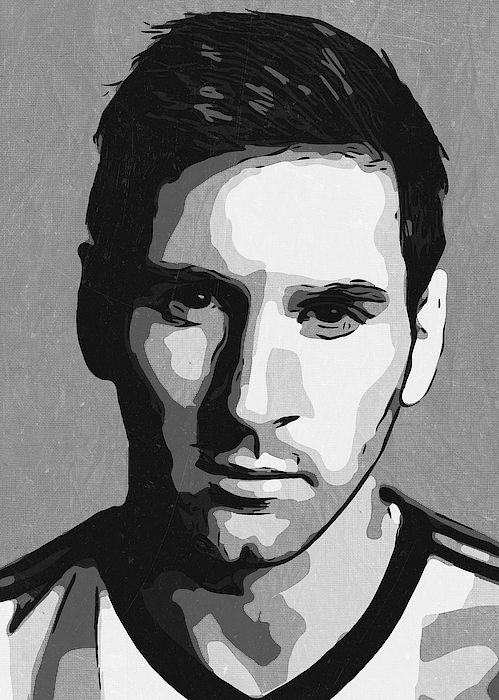

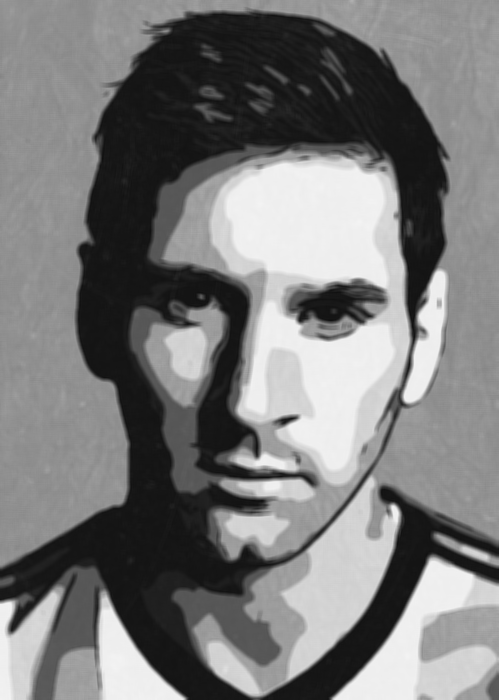

In [32]:
img = cv2.imread('/content/messi50.jpg', 0)
blur = cv2.boxFilter(img,-1,(5,5), normalize = True)
cv2_imshow(img)
cv2_imshow(blur)


# Median

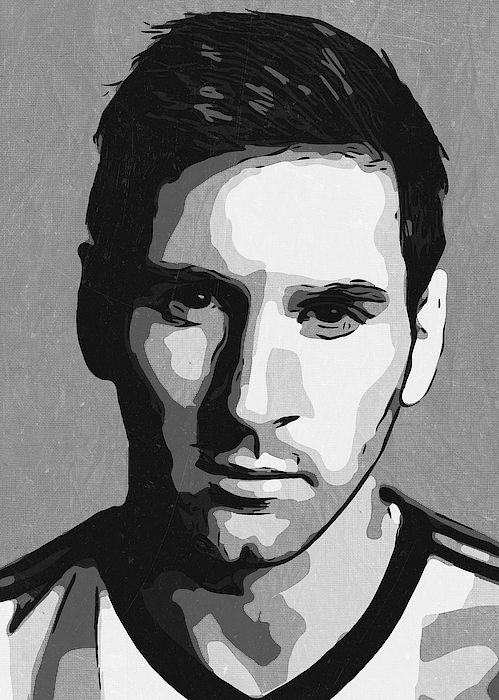

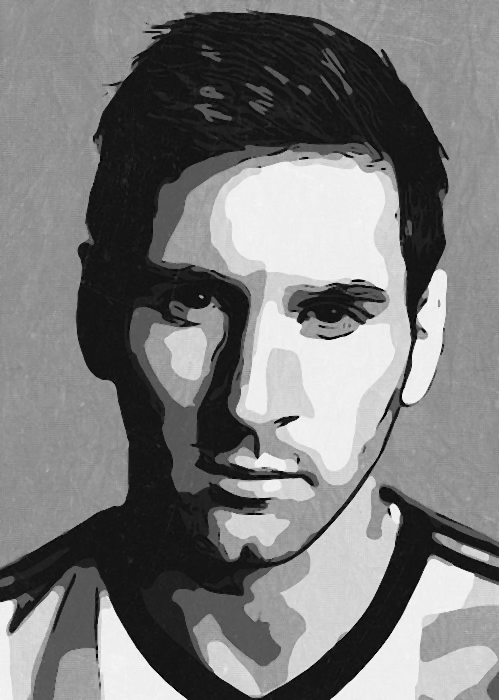

In [33]:
# Load an image
img = cv2.imread('/content/messi50.jpg', 0)

# Apply median filter
median = cv2.medianBlur(img,3)

# Display the image
cv2_imshow(img)
cv2_imshow(median)

# Unsharp Masking


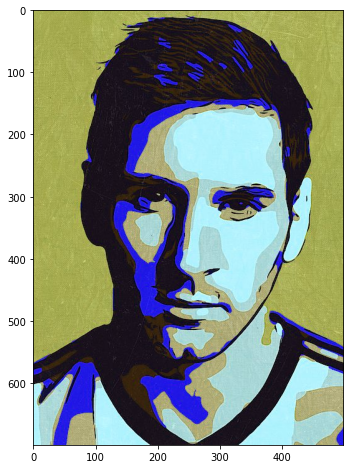

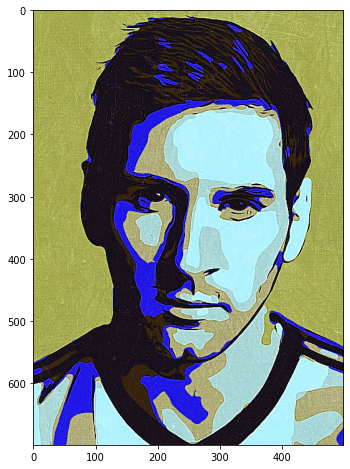

In [34]:
img = cv2.imread('/content/messi50.jpg')

# Blur the image
gauss = cv2.GaussianBlur(img, (7,7), 0)
# Apply Unsharp masking
unsharp_image = cv2.addWeighted(img, 2, gauss, -1, 0)


plt.figure(figsize=(8,8))
plt.imshow(img)
plt.show()
plt.figure(figsize=(8,8))
plt.imshow(unsharp_image)
plt.show()

# Second order derivative(Laplacian filter)


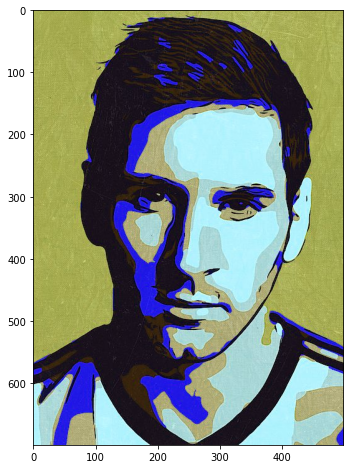

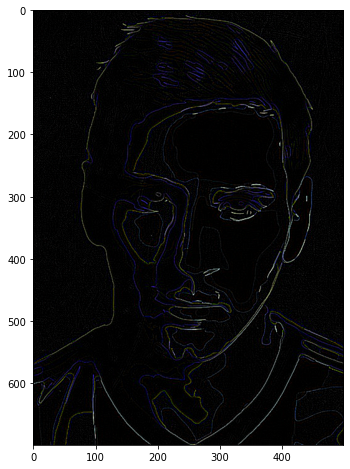

In [35]:
# Load the image
img = cv2.imread('/content/messi50.jpg')

# Apply Gaussian Blur
blur = cv2.GaussianBlur(img,(3,3),0)

# Apply Laplacian operator in some higher datatype
laplacian = cv2.Laplacian(blur,cv2.CV_64F)

# But this tends to localize the edge towards the brighter side.
laplacian1 = laplacian/laplacian.max()
 
plt.figure(figsize=(8,8))
plt.imshow(img)
plt.show()
plt.figure(figsize=(8,8))
plt.imshow(laplacian1)
plt.show()

# Thresholding


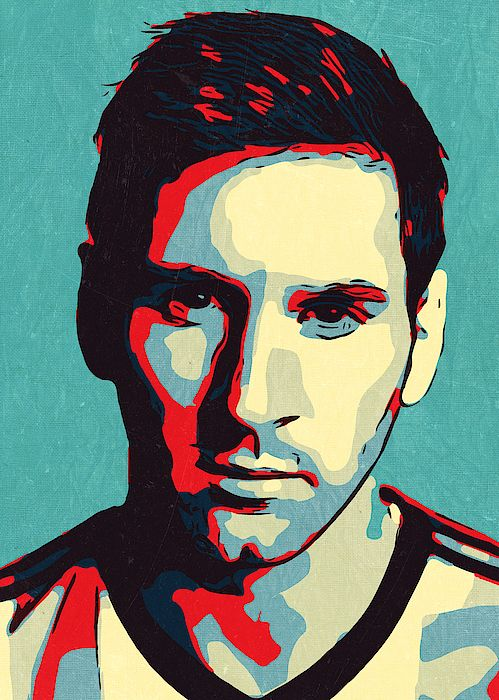

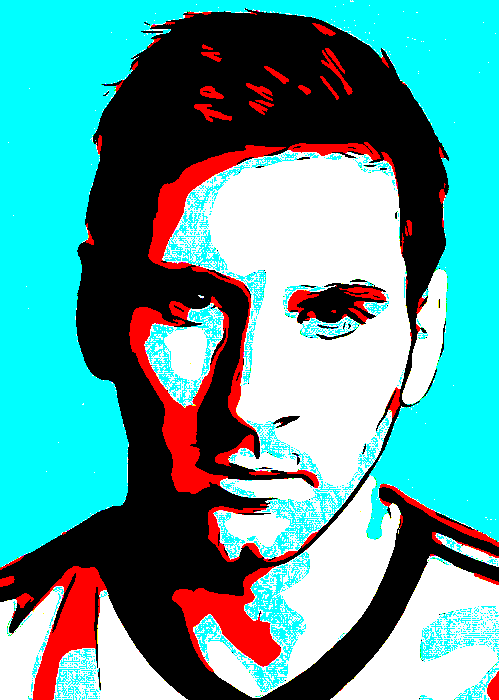

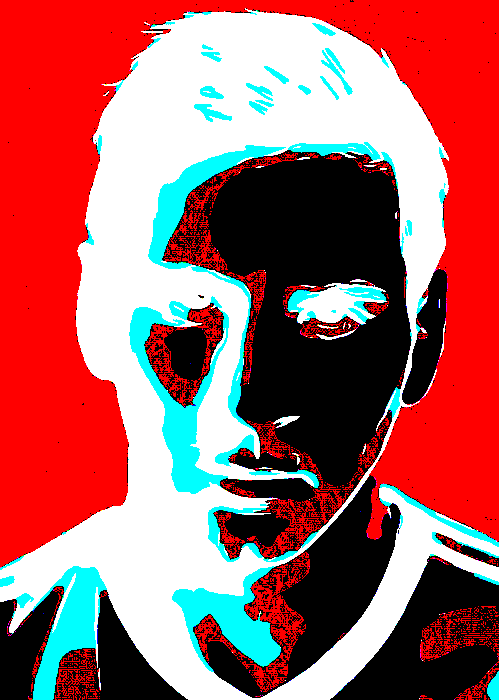

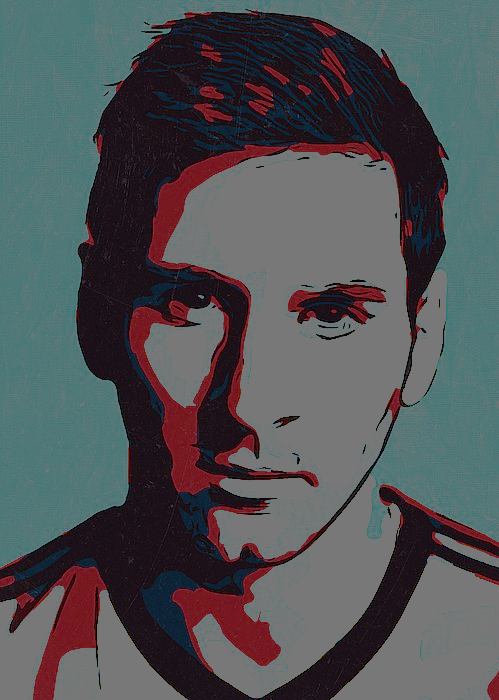

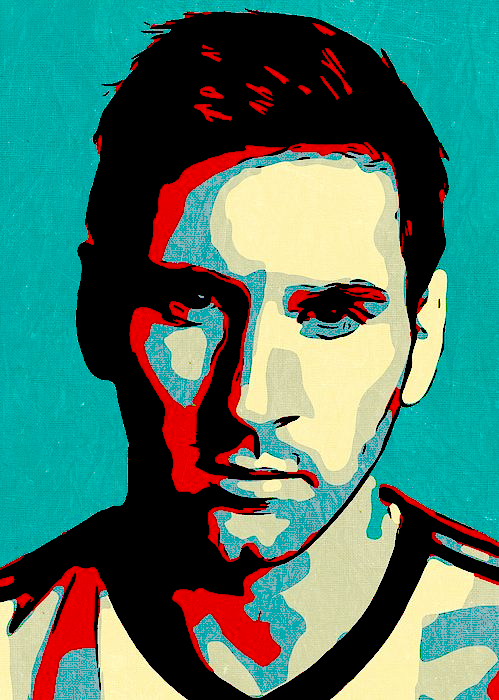

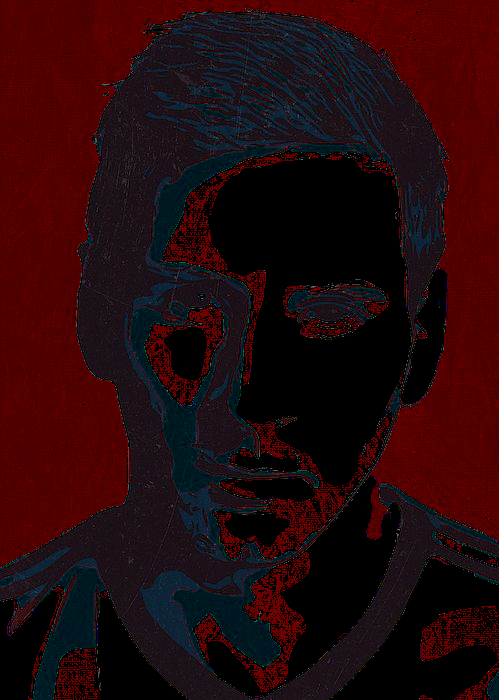

In [36]:
# Python program to illustrate
# simple thresholding type on an image
	
# organizing imports
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# path to input image is specified and
# image is loaded with imread command
image1 = cv2.imread('/content/messi50.jpg')

# cv2.cvtColor is applied over the
# image input with applied parameters
# to convert the image in grayscale

# applying different thresholding
# techniques on the input image
# all pixels value above 120 will
# be set to 255
ret, thresh1 = cv2.threshold(image1, 120, 255, cv2.THRESH_BINARY)
ret, thresh2 = cv2.threshold(image1, 120, 255, cv2.THRESH_BINARY_INV)
ret, thresh3 = cv2.threshold(image1, 120, 255, cv2.THRESH_TRUNC)
ret, thresh4 = cv2.threshold(image1, 120, 255, cv2.THRESH_TOZERO)
ret, thresh5 = cv2.threshold(image1, 120, 255, cv2.THRESH_TOZERO_INV)

# the window showing output images
# with the corresponding thresholding
# techniques applied to the input images

cv2_imshow(image1)
cv2_imshow(thresh1) #'Binary Threshold'
cv2_imshow(thresh2)#'Binary Threshold Inverted'
cv2_imshow(thresh3)#'Truncated Threshold' 
cv2_imshow(thresh4)#'Set to 0'
cv2_imshow( thresh5)#'Set to 0 Inverted'



# Adaptive Thresholding

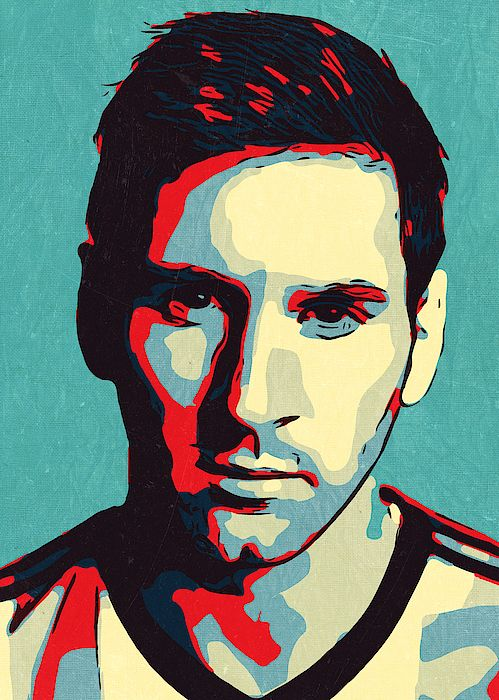

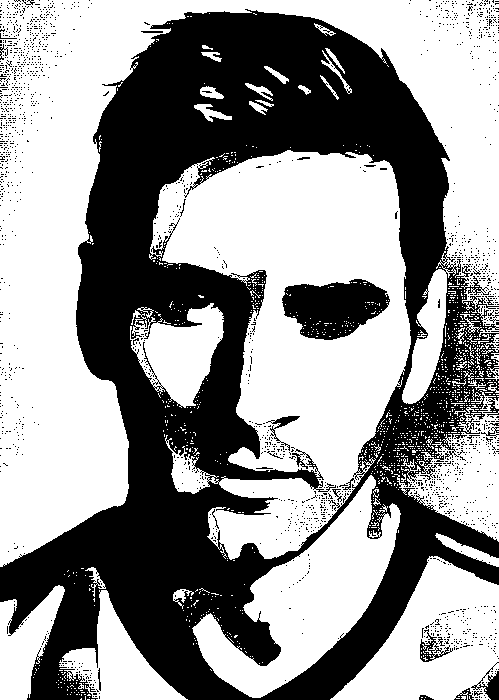

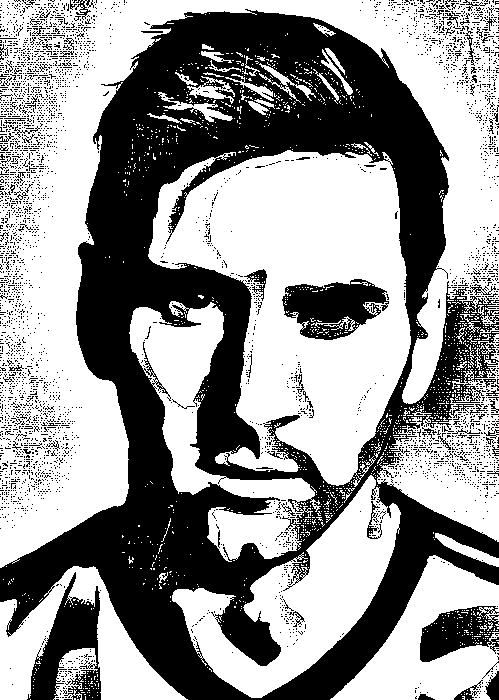

In [37]:
# Python program to illustrate
# adaptive thresholding type on an image
	
# organizing imports
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# path to input image is specified and
# image is loaded with imread command
image1 = cv2.imread('/content/messi50.jpg')

# cv2.cvtColor is applied over the
# image input with applied parameters
# to convert the image in grayscale
img = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

# applying different thresholding
# techniques on the input image
thresh1 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
										cv2.THRESH_BINARY, 199, 5)

thresh2 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
										cv2.THRESH_BINARY, 199, 5)

# the window showing output images
# with the corresponding thresholding
# techniques applied to the input image
cv2_imshow(image1)

cv2_imshow( thresh1)#'Adaptive Mean',
cv2_imshow(thresh2)#'Adaptive Gaussian', 

	
# De-allocate any associated memory usage
if cv2.waitKey(0) & 0xff == 27:
	cv2.destroyAllWindows()


# **Data Augmentation**


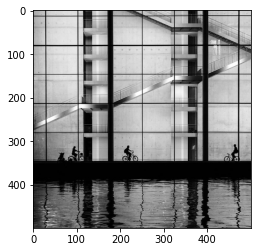

In [38]:
from numpy import expand_dims
from google.colab.patches import cv2_imshow
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
# load the image
img = load_img('/content/test5.jpg')
plt.imshow(img)

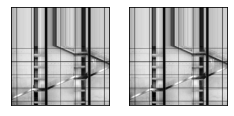

In [39]:
data = img_to_array(img)
samples = expand_dims(data, 0)
#setting an array from which the algorith will randomly choose
datagen = ImageDataGenerator(width_shift_range=[-200,200])
_ = datagen.flow(samples, batch_size=1)
for i in range(2):
    batch = _.next()
    image = batch[0].astype('uint8')
    plt.subplot(130 + 1 + i)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
plt.show()

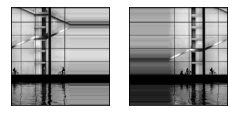

In [40]:
datagen = ImageDataGenerator(height_shift_range=[-200,200])
_ = datagen.flow(samples, batch_size=1)
for i in range(2):
    batch = _.next()
    image = batch[0].astype('uint8')
    plt.subplot(130 + 1 + i)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
plt.show()

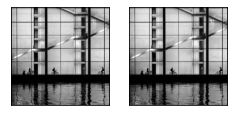

In [41]:
#horizontal flipping
datagen = ImageDataGenerator(horizontal_flip=True)
_ = datagen.flow(samples, batch_size=1)
for i in range(2):
    batch = _.next()
    image = batch[0].astype('uint8')
    plt.subplot(130 + 1 + i)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
plt.show()

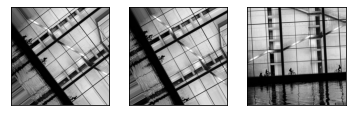

In [42]:
#Rotating the picture. Similar to flipping, but with customizable angles of rotations.
datagen = ImageDataGenerator(rotation_range=90)
_ = datagen.flow(samples, batch_size=1)
for i in range(3):
    batch = _.next()
    image = batch[0].astype('uint8')
    plt.subplot(130 + 1 + i)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
plt.show()

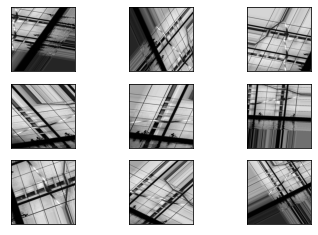

In [43]:
#Of course, all the techniques seen above can be combined into a unique 
#ImageDataGenerator object, so that, in addition to the single changes, 
#there can be a potentially infinite number of combinations among them, leading to more new data.

datagen = ImageDataGenerator(width_shift_range=[-100,100], 
                             height_shift_range=[-100,100],
                             zoom_range=[0.5,1.5],
                             rotation_range=90)
_ = datagen.flow(samples, batch_size=1)
for i in range(9):
    batch = _.next()
    image = batch[0].astype('uint8')
    plt.subplot(330 + 1 + i)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
plt.show()

**Convolutional Neural Network (CNN)**

In [48]:
# keras imports for the dataset and building our neural network
from keras.datasets import cifar10
from keras.models import Sequential
from keras.layers import Dense, Dropout, Conv2D, MaxPool2D, Flatten
from keras.utils import np_utils

In [49]:

# loading the dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

170498071/170498071 [==============================] - 11s 0us/step


In [50]:
# # building the input vector from the 32x32 pixels
X_train = X_train.reshape(X_train.shape[0], 32, 32, 3)
X_test = X_test.reshape(X_test.shape[0], 32, 32, 3)
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')

In [51]:

# normalizing the data to help with the training
X_train /= 255
X_test /= 255

In [52]:
# one-hot encoding using keras' numpy-related utilities
n_classes = 10
print("Shape before one-hot encoding: ", y_train.shape)
Y_train = np_utils.to_categorical(y_train, n_classes)
Y_test = np_utils.to_categorical(y_test, n_classes)
print("Shape after one-hot encoding: ", Y_train.shape)


Shape before one-hot encoding:  (50000, 1)
Shape after one-hot encoding:  (50000, 10)


In [54]:
 #building a linear stack of layers with the sequential model
model = Sequential()

In [55]:
# convolutional layer
model.add(Conv2D(50, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))

In [56]:
# convolutional layer
model.add(Conv2D(75, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu'))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Dropout(0.25))

In [57]:

model.add(Conv2D(125, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu'))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Dropout(0.25))


In [58]:
# flatten output of conv
model.add(Flatten())

In [60]:
# hidden layer
model.add(Dense(500, activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(250, activation='relu'))
model.add(Dropout(0.3))
# output layer
model.add(Dense(10, activation='softmax'))

In [61]:

# compiling the sequential model
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')

In [62]:
# training the model for 10 epochs
model.fit(X_train, Y_train, batch_size=128, epochs=10, validation_data=(X_test, Y_test))

Epoch 1/10
391/391 [==============================] - 591s 2s/step - loss: 1.6386 - accuracy: 0.3965 - val_loss: 1.2412 - val_accuracy: 0.5569
Epoch 2/10
391/391 [==============================] - 584s 1s/step - loss: 1.1534 - accuracy: 0.5896 - val_loss: 0.9482 - val_accuracy: 0.6709
Epoch 3/10
391/391 [==============================] - 578s 1s/step - loss: 0.9580 - accuracy: 0.6628 - val_loss: 0.8253 - val_accuracy: 0.7155
Epoch 4/10
391/391 [==============================] - 581s 1s/step - loss: 0.8337 - accuracy: 0.7090 - val_loss: 0.7678 - val_accuracy: 0.7297
Epoch 5/10
391/391 [==============================] - 578s 1s/step - loss: 0.7581 - accuracy: 0.7365 - val_loss: 0.7097 - val_accuracy: 0.7570
Epoch 6/10
391/391 [==============================] - 577s 1s/step - loss: 0.6885 - accuracy: 0.7594 - val_loss: 0.6796 - val_accuracy: 0.7674
Epoch 7/10
391/391 [==============================] - 577s 1s/step - loss: 0.6223 - accuracy: 0.7821 - val_loss: 0.6755 - val_accuracy: 0.7679